In [43]:
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, f1_score, jaccard_score
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import cv2


In [44]:
def dice_coefficient(y_true, y_pred, smooth=1):
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)

def dice_loss(y_true, y_pred):
    return 1 - dice_coefficient(y_true, y_pred)


🔹 Cell 3: Load Dataset (PNG)

In [47]:
# 🟩 Code Cell: Load & Preprocess PNG Images and Masks
def load_data(image_dir, mask_dir, img_size=(128, 128)):
    images, masks = [], []
    missing_masks = []
    broken_images = []
    broken_masks = []

    for filename in sorted(os.listdir(image_dir)):
        if not filename.lower().endswith(".png"):
            continue

        img_path  = os.path.join(image_dir, filename)
        mask_path = os.path.join(mask_dir,  filename)

        if not os.path.exists(mask_path):
            missing_masks.append(filename)
            continue

        # read files
        img  = cv2.imread(img_path,  cv2.IMREAD_COLOR)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        if img is None:
            broken_images.append(filename)
            continue
        if mask is None:
            broken_masks.append(filename)
            continue

        # resize
        img  = cv2.resize(img,  img_size)
        mask = cv2.resize(mask, img_size)

        # normalize image to [0,1]
        img = img.astype(np.float32) / 255.0

        # binarize mask to 0 or 1
        _, mask_bin = cv2.threshold(mask, 127, 1, cv2.THRESH_BINARY)
        mask_bin = mask_bin.astype(np.float32)[..., np.newaxis]

        images.append(img)
        masks.append(mask_bin)

    # summary of what was loaded / skipped
    print(f"[INFO] Loaded {len(images)} image–mask pairs")
    if missing_masks:
        print(f"[WARN] Missing masks for {len(missing_masks)} images: {missing_masks[:5]}{'...' if len(missing_masks)>5 else ''}")
    if broken_images:
        print(f"[WARN] Failed to load {len(broken_images)} image files: {broken_images[:5]}{'...' if len(broken_images)>5 else ''}")
    if broken_masks:
        print(f"[WARN] Failed to load {len(broken_masks)} mask files: {broken_masks[:5]}{'...' if len(broken_masks)>5 else ''}")

    return np.array(images), np.array(masks)

# Usage:
train_img_dir  = "/content/drive/MyDrive/Road_dataset/tiff/train"
train_mask_dir = "/content/drive/MyDrive/Road_dataset/tiff/train_labels"
X, y = load_data(train_img_dir, train_mask_dir, img_size=(256, 256))


[INFO] Loaded 1108 image–mask pairs


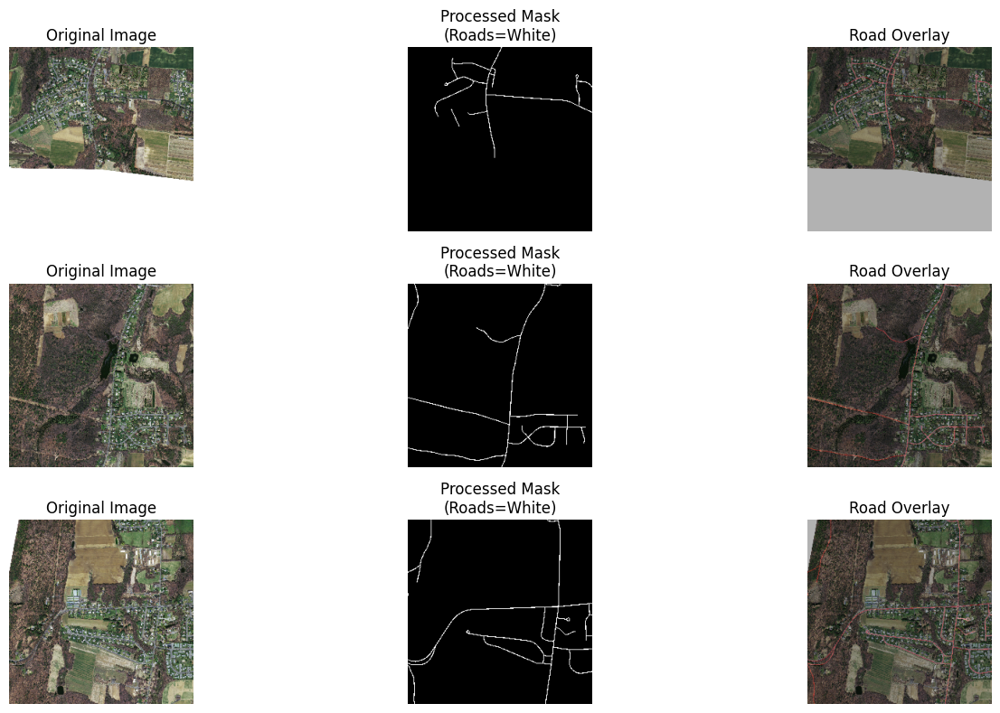

In [48]:
# 🔹 Cell 4: Visualize Sample Inputs, Masks, and Road Overlay

import matplotlib.pyplot as plt
import cv2

# Show three random samples (or change indices as you like)
idxs = [0, 1, 2]

plt.figure(figsize=(15, 8))
for i, idx in enumerate(idxs):
    img  = (X[idx] * 255).astype('uint8')           # back to 0–255
    mask = (y[idx].squeeze() * 255).astype('uint8')  # single‐channel mask

    # Convert BGR→RGB for display
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Create a red overlay where mask == 255
    red_mask = np.zeros_like(img)
    red_mask[..., 2] = mask                          # put mask into R channel
    overlay = cv2.addWeighted(img, 0.7, red_mask, 0.3, 0)
    overlay_rgb = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)

    # Plot Original
    plt.subplot(3, 3, i*3 + 1)
    plt.imshow(img_rgb)
    plt.title("Original Image")
    plt.axis('off')

    # Plot Mask
    plt.subplot(3, 3, i*3 + 2)
    plt.imshow(mask, cmap='gray')
    plt.title("Processed Mask\n(Roads=White)")
    plt.axis('off')

    # Plot Overlay
    plt.subplot(3, 3, i*3 + 3)
    plt.imshow(overlay_rgb)
    plt.title("Road Overlay")
    plt.axis('off')

plt.tight_layout()
plt.show()


In [64]:
# 🔹 Cell 5: Custom Metrics, Loss & U‑Net Model Definition

import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.layers import (Input, Conv2D, BatchNormalization, Activation,
                                     MaxPooling2D, Dropout, UpSampling2D, concatenate)
from tensorflow.keras.models import Model
from tensorflow.keras.losses import BinaryCrossentropy

# Losses
bce = tf.keras.losses.BinaryCrossentropy()

def dice_coef(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    inter = tf.reduce_sum(y_true_f * y_pred_f)
    return (2. * inter + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)

def iou_coef(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    inter = tf.reduce_sum(y_true_f * y_pred_f)
    union = tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) - inter
    return (inter + smooth) / (union + smooth)

def bce_dice_loss(y_true, y_pred):
    return bce(y_true, y_pred) + (1 - dice_coef(y_true, y_pred))


# — U‑Net Architecture with BatchNorm & Dropout —
def build_unet(input_shape=(256,256,3), dropout=0.1): # Changed input_shape to (256, 256, 3)
    def conv_block(x, filters):
        x = Conv2D(filters, 3, padding='same')(x)
        x = BatchNormalization()(x)
        x = Activation('relu')(x)
        x = Conv2D(filters, 3, padding='same')(x)
        x = BatchNormalization()(x)
        x = Activation('relu')(x)
        return x

    def encoder_block(x, filters):
        c = conv_block(x, filters)
        p = MaxPooling2D()(c)
        p = Dropout(dropout)(p)
        return c, p

    def decoder_block(x, skip, filters):
        u = UpSampling2D()(x)
        u = Conv2D(filters, 2, padding='same')(u)
        u = Activation('relu')(u)
        m = concatenate([u, skip])
        c = conv_block(m, filters)
        c = Dropout(dropout)(c)
        return c

    inputs = Input(input_shape)
    # Encoder
    s1, p1 = encoder_block(inputs,  64)
    s2, p2 = encoder_block(p1,     128)
    s3, p3 = encoder_block(p2,     256)
    s4, p4 = encoder_block(p3,     512)
    # Bridge
    b5, _ = encoder_block(p4,     1024)
    # Decoder
    d6 = decoder_block(b5, s4,    512)
    d7 = decoder_block(d6, s3,    256)
    d8 = decoder_block(d7, s2,    128)
    d9 = decoder_block(d8, s1,     64)
    # Output
    outputs = Conv2D(1, 1, activation='sigmoid')(d9)

    return Model(inputs, outputs)

# Instantiate to verify with the correct input shape
model = build_unet((256,256,3)) # Changed input_shape to (256, 256, 3)
model.summary()


Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_134 (Conv2D) │ (None, 256, 256,  │      1,792 │ input_layer_6[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_134[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_110      │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_135 (Conv2D) │ (None, 256, 256,  │     36,928 │ activation_110[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_135[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_111      │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_29    │ (None, 128, 128,  │          0 │ activation_111[0… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_45          │ (None, 128, 128,  │          0 │ max_pooling2d_29… │
│ (Dropout)           │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_136 (Conv2D) │ (None, 128, 128,  │     73,856 │ dropout_45[0][0]  │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_136[0][0]  │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_112      │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_137 (Conv2D) │ (None, 128, 128,  │    147,584 │ activation_112[0… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_137[0][0]  │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_113      │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_30    │ (None, 64, 64,    │          0 │ activation_113[0… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_46          │ (None, 64, 64,    │          0 │ max_pooling2d_30

 Total params: 31,055,297 (118.47 MB)

 Trainable params: 31,043,521 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

In [65]:
# 🔹 Cell 6: Load & Split Data

from sklearn.model_selection import train_test_split

# X, y have been loaded and preprocessed in Cell 3
# Split into 70% train / 15% val / 15% test

X_train, X_temp, y_train, y_temp = train_test_split(
    X, y,
    test_size=0.30,
    random_state=42,
    shuffle=True
)

X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp,
    test_size=0.50,
    random_state=42,
    shuffle=True
)

print(f"Training set:   {X_train.shape} inputs, {y_train.shape} masks")
print(f"Validation set: {X_val.shape} inputs, {y_val.shape} masks")
print(f"Test set:       {X_test.shape} inputs, {y_test.shape} masks")


Training set:   (775, 256, 256, 3) inputs, (775, 256, 256, 1) masks
Validation set: (166, 256, 256, 3) inputs, (166, 256, 256, 1) masks
Test set:       (167, 256, 256, 3) inputs, (167, 256, 256, 1) masks


In [66]:
# 🟩 Cell 7: Optimized Training with Early Stopping, LR Scheduler, and Checkpoint

from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt


# Compile the model
model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss=bce_dice_loss,
    metrics=[dice_coef, iou_coef, 'accuracy']
)

# Callbacks
checkpoint_cb = ModelCheckpoint("best_unet_model.h5",
                                save_best_only=True,
                                monitor="val_loss",
                                mode="min",
                                verbose=1)

earlystop_cb = EarlyStopping(
    monitor="val_loss",
    min_delta=1e-4,       # minimum change to qualify as an improvement
    patience=10,          # stop after 10 epochs of no improvement
    verbose=1,
    restore_best_weights=True
)

reduce_lr_cb = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=100,
    batch_size=16,
    callbacks=[checkpoint_cb, earlystop_cb, reduce_lr_cb],
    verbose=1
)



Epoch 1/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step - accuracy: 0.7460 - dice_coef: 0.1010 - iou_coef: 0.0533 - loss: 1.4406
Epoch 1: val_loss improved from inf to 1.46618, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 53s 537ms/step - accuracy: 0.7481 - dice_coef: 0.1012 - iou_coef: 0.0534 - loss: 1.4381 - val_accuracy: 0.9527 - val_dice_coef: 0.0833 - val_iou_coef: 0.0435 - val_loss: 1.4662 - learning_rate: 1.0000e-04
Epoch 2/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9418 - dice_coef: 0.1349 - iou_coef: 0.0724 - loss: 1.1104
Epoch 2: val_loss improved from 1.46618 to 1.34298, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - accuracy: 0.9418 - dice_coef: 0.1350 - iou_coef: 0.0725 - loss: 1.1100 - val_accuracy: 0.9534 - val_dice_coef: 0.0834 - val_iou_coef: 0.0436 - val_loss: 1.3430 - learning_rate: 1.0000e-04
Epoch 3/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9367 - dice_coef: 0.1626 - iou_coef: 0.0886 - loss: 1.0522
Epoch 3: val_loss improved from 1.34298 to 1.22989, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 139ms/step - accuracy: 0.9366 - dice_coef: 0.1629 - iou_coef: 0.0888 - loss: 1.0519 - val_accuracy: 0.9534 - val_dice_coef: 0.0830 - val_iou_coef: 0.0434 - val_loss: 1.2299 - learning_rate: 1.0000e-04
Epoch 4/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9345 - dice_coef: 0.2035 - iou_coef: 0.1134 - loss: 0.9990
Epoch 4: val_loss improved from 1.22989 to 1.15006, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - accuracy: 0.9345 - dice_coef: 0.2037 - iou_coef: 0.1135 - loss: 0.9988 - val_accuracy: 0.9534 - val_dice_coef: 0.0677 - val_iou_coef: 0.0351 - val_loss: 1.1501 - learning_rate: 1.0000e-04
Epoch 5/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9357 - dice_coef: 0.2395 - iou_coef: 0.1362 - loss: 0.9547
Epoch 5: val_loss improved from 1.15006 to 1.12968, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - accuracy: 0.9357 - dice_coef: 0.2396 - iou_coef: 0.1362 - loss: 0.9545 - val_accuracy: 0.9534 - val_dice_coef: 0.0689 - val_iou_coef: 0.0357 - val_loss: 1.1297 - learning_rate: 1.0000e-04
Epoch 6/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9403 - dice_coef: 0.2704 - iou_coef: 0.1565 - loss: 0.9111
Epoch 6: val_loss improved from 1.12968 to 1.11194, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 143ms/step - accuracy: 0.9403 - dice_coef: 0.2704 - iou_coef: 0.1565 - loss: 0.9109 - val_accuracy: 0.9534 - val_dice_coef: 0.0682 - val_iou_coef: 0.0353 - val_loss: 1.1119 - learning_rate: 1.0000e-04
Epoch 7/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9440 - dice_coef: 0.2949 - iou_coef: 0.1733 - loss: 0.8768
Epoch 7: val_loss did not improve from 1.11194
49/49 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - accuracy: 0.9440 - dice_coef: 0.2949 - iou_coef: 0.1734 - loss: 0.8767 - val_accuracy: 0.9533 - val_dice_coef: 0.0612 - val_iou_coef: 0.0316 - val_loss: 1.1184 - learning_rate: 1.0000e-04
Epoch 8/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9475 - dice_coef: 0.3211 - iou_coef: 0.1916 - loss: 0.8417
Epoch 8: val_loss improved from 1.11194 to 1.10012, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - accuracy: 0.9476 - dice_coef: 0.3212 - iou_coef: 0.1917 - loss: 0.8415 - val_accuracy: 0.9517 - val_dice_coef: 0.0788 - val_iou_coef: 0.0411 - val_loss: 1.1001 - learning_rate: 1.0000e-04
Epoch 9/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9517 - dice_coef: 0.3407 - iou_coef: 0.2056 - loss: 0.8118
Epoch 9: val_loss did not improve from 1.10012
49/49 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - accuracy: 0.9517 - dice_coef: 0.3407 - iou_coef: 0.2056 - loss: 0.8119 - val_accuracy: 0.9545 - val_dice_coef: 0.1918 - val_iou_coef: 0.1062 - val_loss: 1.1949 - learning_rate: 1.0000e-04
Epoch 10/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9508 - dice_coef: 0.3477 - iou_coef: 0.2109 - loss: 0.8061
Epoch 10: val_loss improved from 1.10012 to 0.97515, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 144ms/step - accuracy: 0.9508 - dice_coef: 0.3480 - iou_coef: 0.2111 - loss: 0.8058 - val_accuracy: 0.9485 - val_dice_coef: 0.2005 - val_iou_coef: 0.1117 - val_loss: 0.9752 - learning_rate: 1.0000e-04
Epoch 11/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - accuracy: 0.9545 - dice_coef: 0.3852 - iou_coef: 0.2389 - loss: 0.7581
Epoch 11: val_loss improved from 0.97515 to 0.85995, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - accuracy: 0.9545 - dice_coef: 0.3852 - iou_coef: 0.2389 - loss: 0.7580 - val_accuracy: 0.9520 - val_dice_coef: 0.2925 - val_iou_coef: 0.1716 - val_loss: 0.8600 - learning_rate: 1.0000e-04
Epoch 12/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9538 - dice_coef: 0.4014 - iou_coef: 0.2515 - loss: 0.7439
Epoch 12: val_loss improved from 0.85995 to 0.76778, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 140ms/step - accuracy: 0.9539 - dice_coef: 0.4015 - iou_coef: 0.2516 - loss: 0.7437 - val_accuracy: 0.9533 - val_dice_coef: 0.3701 - val_iou_coef: 0.2276 - val_loss: 0.7678 - learning_rate: 1.0000e-04
Epoch 13/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9561 - dice_coef: 0.4259 - iou_coef: 0.2711 - loss: 0.7136
Epoch 13: val_loss improved from 0.76778 to 0.74291, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 144ms/step - accuracy: 0.9561 - dice_coef: 0.4258 - iou_coef: 0.2710 - loss: 0.7136 - val_accuracy: 0.9502 - val_dice_coef: 0.3992 - val_iou_coef: 0.2497 - val_loss: 0.7429 - learning_rate: 1.0000e-04
Epoch 14/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9584 - dice_coef: 0.4464 - iou_coef: 0.2880 - loss: 0.6871
Epoch 14: val_loss did not improve from 0.74291
49/49 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - accuracy: 0.9584 - dice_coef: 0.4462 - iou_coef: 0.2879 - loss: 0.6872 - val_accuracy: 0.9439 - val_dice_coef: 0.4043 - val_iou_coef: 0.2538 - val_loss: 0.7490 - learning_rate: 1.0000e-04
Epoch 15/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9608 - dice_coef: 0.4452 - iou_coef: 0.2869 - loss: 0.6829
Epoch 15: val_loss improved from 0.74291 to 0.67944, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - accuracy: 0.9607 - dice_coef: 0.4453 - iou_coef: 0.2870 - loss: 0.6829 - val_accuracy: 0.9619 - val_dice_coef: 0.4389 - val_iou_coef: 0.2818 - val_loss: 0.6794 - learning_rate: 1.0000e-04
Epoch 16/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9598 - dice_coef: 0.4627 - iou_coef: 0.3016 - loss: 0.6678
Epoch 16: val_loss improved from 0.67944 to 0.66401, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 143ms/step - accuracy: 0.9598 - dice_coef: 0.4628 - iou_coef: 0.3016 - loss: 0.6678 - val_accuracy: 0.9598 - val_dice_coef: 0.4571 - val_iou_coef: 0.2969 - val_loss: 0.6640 - learning_rate: 1.0000e-04
Epoch 17/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9613 - dice_coef: 0.4790 - iou_coef: 0.3157 - loss: 0.6488
Epoch 17: val_loss improved from 0.66401 to 0.64580, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - accuracy: 0.9613 - dice_coef: 0.4790 - iou_coef: 0.3157 - loss: 0.6488 - val_accuracy: 0.9579 - val_dice_coef: 0.4805 - val_iou_coef: 0.3168 - val_loss: 0.6458 - learning_rate: 1.0000e-04
Epoch 18/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9614 - dice_coef: 0.4959 - iou_coef: 0.3301 - loss: 0.6315
Epoch 18: val_loss improved from 0.64580 to 0.62044, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 143ms/step - accuracy: 0.9614 - dice_coef: 0.4958 - iou_coef: 0.3301 - loss: 0.6315 - val_accuracy: 0.9617 - val_dice_coef: 0.4997 - val_iou_coef: 0.3337 - val_loss: 0.6204 - learning_rate: 1.0000e-04
Epoch 19/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9604 - dice_coef: 0.4885 - iou_coef: 0.3240 - loss: 0.6445
Epoch 19: val_loss improved from 0.62044 to 0.60563, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - accuracy: 0.9605 - dice_coef: 0.4888 - iou_coef: 0.3242 - loss: 0.6440 - val_accuracy: 0.9634 - val_dice_coef: 0.5101 - val_iou_coef: 0.3431 - val_loss: 0.6056 - learning_rate: 1.0000e-04
Epoch 20/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9635 - dice_coef: 0.5179 - iou_coef: 0.3501 - loss: 0.6035
Epoch 20: val_loss did not improve from 0.60563
49/49 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - accuracy: 0.9635 - dice_coef: 0.5178 - iou_coef: 0.3500 - loss: 0.6036 - val_accuracy: 0.9606 - val_dice_coef: 0.5139 - val_iou_coef: 0.3464 - val_loss: 0.6073 - learning_rate: 1.0000e-04
Epoch 21/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9647 - dice_coef: 0.5248 - iou_coef: 0.3563 - loss: 0.5944
Epoch 21: val_loss improved from 0.60563 to 0.58832, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 143ms/step - accuracy: 0.9647 - dice_coef: 0.5248 - iou_coef: 0.3563 - loss: 0.5945 - val_accuracy: 0.9638 - val_dice_coef: 0.5266 - val_iou_coef: 0.3581 - val_loss: 0.5883 - learning_rate: 1.0000e-04
Epoch 22/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - accuracy: 0.9641 - dice_coef: 0.5304 - iou_coef: 0.3616 - loss: 0.5920
Epoch 22: val_loss did not improve from 0.58832
49/49 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - accuracy: 0.9641 - dice_coef: 0.5304 - iou_coef: 0.3616 - loss: 0.5920 - val_accuracy: 0.9591 - val_dice_coef: 0.5143 - val_iou_coef: 0.3469 - val_loss: 0.6107 - learning_rate: 1.0000e-04
Epoch 23/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9644 - dice_coef: 0.5296 - iou_coef: 0.3608 - loss: 0.5930
Epoch 23: val_loss improved from 0.58832 to 0.57355, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 138ms/step - accuracy: 0.9644 - dice_coef: 0.5298 - iou_coef: 0.3610 - loss: 0.5928 - val_accuracy: 0.9662 - val_dice_coef: 0.5396 - val_iou_coef: 0.3702 - val_loss: 0.5735 - learning_rate: 1.0000e-04
Epoch 24/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9640 - dice_coef: 0.5374 - iou_coef: 0.3684 - loss: 0.5875
Epoch 24: val_loss improved from 0.57355 to 0.56404, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - accuracy: 0.9640 - dice_coef: 0.5376 - iou_coef: 0.3686 - loss: 0.5872 - val_accuracy: 0.9663 - val_dice_coef: 0.5502 - val_iou_coef: 0.3803 - val_loss: 0.5640 - learning_rate: 1.0000e-04
Epoch 25/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9677 - dice_coef: 0.5563 - iou_coef: 0.3858 - loss: 0.5590
Epoch 25: val_loss improved from 0.56404 to 0.56257, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - accuracy: 0.9677 - dice_coef: 0.5563 - iou_coef: 0.3858 - loss: 0.5591 - val_accuracy: 0.9647 - val_dice_coef: 0.5547 - val_iou_coef: 0.3845 - val_loss: 0.5626 - learning_rate: 1.0000e-04
Epoch 26/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9652 - dice_coef: 0.5601 - iou_coef: 0.3898 - loss: 0.5614
Epoch 26: val_loss improved from 0.56257 to 0.54929, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 147ms/step - accuracy: 0.9652 - dice_coef: 0.5601 - iou_coef: 0.3898 - loss: 0.5613 - val_accuracy: 0.9664 - val_dice_coef: 0.5646 - val_iou_coef: 0.3941 - val_loss: 0.5493 - learning_rate: 1.0000e-04
Epoch 27/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9675 - dice_coef: 0.5672 - iou_coef: 0.3967 - loss: 0.5483
Epoch 27: val_loss did not improve from 0.54929
49/49 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - accuracy: 0.9675 - dice_coef: 0.5672 - iou_coef: 0.3967 - loss: 0.5485 - val_accuracy: 0.9639 - val_dice_coef: 0.5640 - val_iou_coef: 0.3933 - val_loss: 0.5554 - learning_rate: 1.0000e-04
Epoch 28/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9659 - dice_coef: 0.5600 - iou_coef: 0.3900 - loss: 0.5617
Epoch 28: val_loss improved from 0.54929 to 0.54016, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - accuracy: 0.9659 - dice_coef: 0.5603 - iou_coef: 0.3902 - loss: 0.5614 - val_accuracy: 0.9670 - val_dice_coef: 0.5720 - val_iou_coef: 0.4014 - val_loss: 0.5402 - learning_rate: 1.0000e-04
Epoch 29/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9660 - dice_coef: 0.5749 - iou_coef: 0.4039 - loss: 0.5465
Epoch 29: val_loss improved from 0.54016 to 0.53866, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - accuracy: 0.9660 - dice_coef: 0.5749 - iou_coef: 0.4040 - loss: 0.5464 - val_accuracy: 0.9666 - val_dice_coef: 0.5753 - val_iou_coef: 0.4045 - val_loss: 0.5387 - learning_rate: 1.0000e-04
Epoch 30/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9679 - dice_coef: 0.5804 - iou_coef: 0.4092 - loss: 0.5358
Epoch 30: val_loss did not improve from 0.53866
49/49 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - accuracy: 0.9679 - dice_coef: 0.5804 - iou_coef: 0.4093 - loss: 0.5358 - val_accuracy: 0.9671 - val_dice_coef: 0.5762 - val_iou_coef: 0.4054 - val_loss: 0.5406 - learning_rate: 1.0000e-04
Epoch 31/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9675 - dice_coef: 0.5776 - iou_coef: 0.4070 - loss: 0.5419
Epoch 31: val_loss improved from 0.53866 to 0.53533, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 143ms/step - accuracy: 0.9675 - dice_coef: 0.5778 - iou_coef: 0.4072 - loss: 0.5417 - val_accuracy: 0.9673 - val_dice_coef: 0.5823 - val_iou_coef: 0.4114 - val_loss: 0.5353 - learning_rate: 1.0000e-04
Epoch 32/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9666 - dice_coef: 0.5926 - iou_coef: 0.4217 - loss: 0.5292
Epoch 32: val_loss improved from 0.53533 to 0.53283, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 138ms/step - accuracy: 0.9666 - dice_coef: 0.5925 - iou_coef: 0.4217 - loss: 0.5292 - val_accuracy: 0.9666 - val_dice_coef: 0.5832 - val_iou_coef: 0.4122 - val_loss: 0.5328 - learning_rate: 1.0000e-04
Epoch 33/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9678 - dice_coef: 0.5913 - iou_coef: 0.4209 - loss: 0.5280
Epoch 33: val_loss did not improve from 0.53283
49/49 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - accuracy: 0.9678 - dice_coef: 0.5915 - iou_coef: 0.4210 - loss: 0.5278 - val_accuracy: 0.9657 - val_dice_coef: 0.5811 - val_iou_coef: 0.4101 - val_loss: 0.5376 - learning_rate: 1.0000e-04
Epoch 34/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9695 - dice_coef: 0.5935 - iou_coef: 0.4231 - loss: 0.5198
Epoch 34: val_loss improved from 0.53283 to 0.52589, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 144ms/step - accuracy: 0.9695 - dice_coef: 0.5936 - iou_coef: 0.4232 - loss: 0.5198 - val_accuracy: 0.9678 - val_dice_coef: 0.5916 - val_iou_coef: 0.4208 - val_loss: 0.5259 - learning_rate: 1.0000e-04
Epoch 35/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9690 - dice_coef: 0.6044 - iou_coef: 0.4342 - loss: 0.5095
Epoch 35: val_loss improved from 0.52589 to 0.52083, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 144ms/step - accuracy: 0.9690 - dice_coef: 0.6045 - iou_coef: 0.4343 - loss: 0.5095 - val_accuracy: 0.9680 - val_dice_coef: 0.5948 - val_iou_coef: 0.4240 - val_loss: 0.5208 - learning_rate: 1.0000e-04
Epoch 36/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9692 - dice_coef: 0.6106 - iou_coef: 0.4400 - loss: 0.5051
Epoch 36: val_loss did not improve from 0.52083
49/49 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - accuracy: 0.9692 - dice_coef: 0.6107 - iou_coef: 0.4400 - loss: 0.5051 - val_accuracy: 0.9678 - val_dice_coef: 0.5889 - val_iou_coef: 0.4181 - val_loss: 0.5292 - learning_rate: 1.0000e-04
Epoch 37/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9700 - dice_coef: 0.6160 - iou_coef: 0.4458 - loss: 0.4969
Epoch 37: val_loss did not improve from 0.52083
49/49 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - accuracy: 0.9699 - dice_coef: 0.6160 - iou_coef: 0.4458 - loss: 0.4969 - val_accuracy: 0.9680 - val_dice_coef: 0.5902 - val_iou_coef: 0.4195 - va

49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - accuracy: 0.9709 - dice_coef: 0.6356 - iou_coef: 0.4666 - loss: 0.4743 - val_accuracy: 0.9685 - val_dice_coef: 0.6006 - val_iou_coef: 0.4299 - val_loss: 0.5156 - learning_rate: 1.0000e-04
Epoch 41/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9712 - dice_coef: 0.6311 - iou_coef: 0.4615 - loss: 0.4795
Epoch 41: val_loss did not improve from 0.51562
49/49 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - accuracy: 0.9711 - dice_coef: 0.6311 - iou_coef: 0.4616 - loss: 0.4795 - val_accuracy: 0.9678 - val_dice_coef: 0.6004 - val_iou_coef: 0.4296 - val_loss: 0.5179 - learning_rate: 1.0000e-04
Epoch 42/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.9719 - dice_coef: 0.6371 - iou_coef: 0.4686 - loss: 0.4713
Epoch 42: val_loss did not improve from 0.51562
49/49 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - accuracy: 0.9719 - dice_coef: 0.6371 - iou_coef: 0.4686 - loss: 0.4714 - val_accuracy: 0.9687 - val_dice_coef: 0.6040 - val_iou_coef: 0.4334 - va

49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - accuracy: 0.9712 - dice_coef: 0.6577 - iou_coef: 0.4911 - loss: 0.4509 - val_accuracy: 0.9682 - val_dice_coef: 0.6034 - val_iou_coef: 0.4329 - val_loss: 0.5148 - learning_rate: 1.0000e-04
Epoch 45/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - accuracy: 0.9730 - dice_coef: 0.6585 - iou_coef: 0.4918 - loss: 0.4464
Epoch 45: val_loss did not improve from 0.51480
49/49 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - accuracy: 0.9730 - dice_coef: 0.6584 - iou_coef: 0.4916 - loss: 0.4466 - val_accuracy: 0.9651 - val_dice_coef: 0.5941 - val_iou_coef: 0.4233 - val_loss: 0.5310 - learning_rate: 1.0000e-04
Epoch 46/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - accuracy: 0.9731 - dice_coef: 0.6518 - iou_coef: 0.4848 - loss: 0.4526
Epoch 46: val_loss did not improve from 0.51480
49/49 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - accuracy: 0.9731 - dice_coef: 0.6519 - iou_coef: 0.4849 - loss: 0.4525 - val_accuracy: 0.9674 - val_dice_coef: 0.6083 - val_iou_coef: 0.4377 - va

In [70]:
# 🟩 Cell 7: Optimized Training with Early Stopping, LR Scheduler, and Checkpoint

from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt


# Compile the model
model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss=bce_dice_loss,
    metrics=[dice_coef, iou_coef, 'accuracy']
)

# Callbacks
checkpoint_cb = ModelCheckpoint("best_unet_model.h5",
                                save_best_only=True,
                                monitor="val_loss",
                                mode="min",
                                verbose=1)

earlystop_cb = EarlyStopping(
    monitor="val_loss",
    min_delta=1e-4,       # minimum change to qualify as an improvement
    patience=10,          # stop after 10 epochs of no improvement
    verbose=1,
    restore_best_weights=True
)

reduce_lr_cb = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=150,
    batch_size=16,
    callbacks=[checkpoint_cb, earlystop_cb, reduce_lr_cb],
    verbose=1
)



Epoch 1/150
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step - accuracy: 0.9722 - dice_coef: 0.6568 - iou_coef: 0.4894 - loss: 0.4508
Epoch 1: val_loss improved from inf to 0.51643, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 53s 530ms/step - accuracy: 0.9722 - dice_coef: 0.6568 - iou_coef: 0.4894 - loss: 0.4508 - val_accuracy: 0.9682 - val_dice_coef: 0.6053 - val_iou_coef: 0.4348 - val_loss: 0.5164 - learning_rate: 1.0000e-04
Epoch 2/150
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - accuracy: 0.9725 - dice_coef: 0.6597 - iou_coef: 0.4932 - loss: 0.4481
Epoch 2: val_loss did not improve from 0.51643
49/49 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - accuracy: 0.9725 - dice_coef: 0.6597 - iou_coef: 0.4932 - loss: 0.4481 - val_accuracy: 0.9670 - val_dice_coef: 0.6049 - val_iou_coef: 0.4343 - val_loss: 0.5212 - learning_rate: 1.0000e-04
Epoch 3/150
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - accuracy: 0.9722 - dice_coef: 0.6728 - iou_coef: 0.5077 - loss: 0.4364
Epoch 3: val_loss did not improve from 0.51643
49/49 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - accuracy: 0.9722 - dice_coef: 0.6727 - iou_coef: 0.5076 - loss: 0.4364 - val_accuracy: 0.9670 - val_dice_coef: 0.6060 - val_iou_coef: 0.4354 - val_l

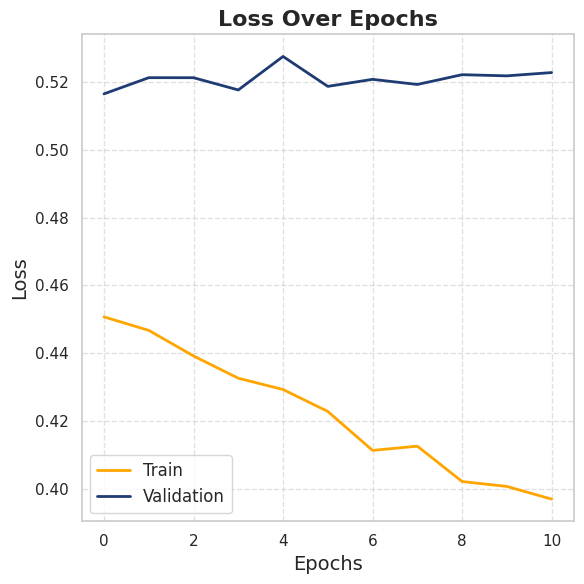

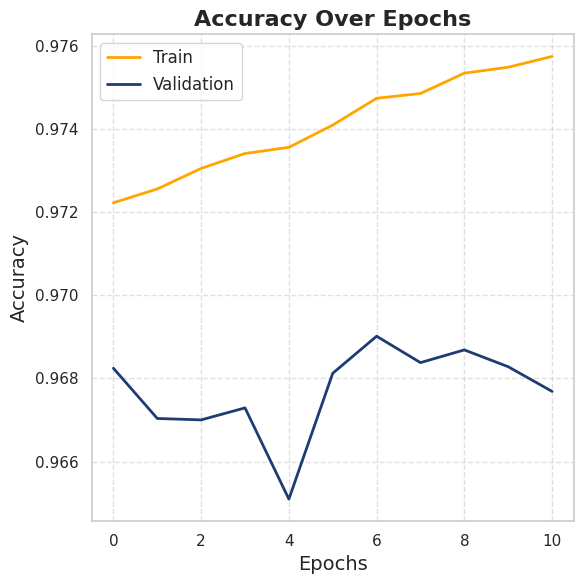

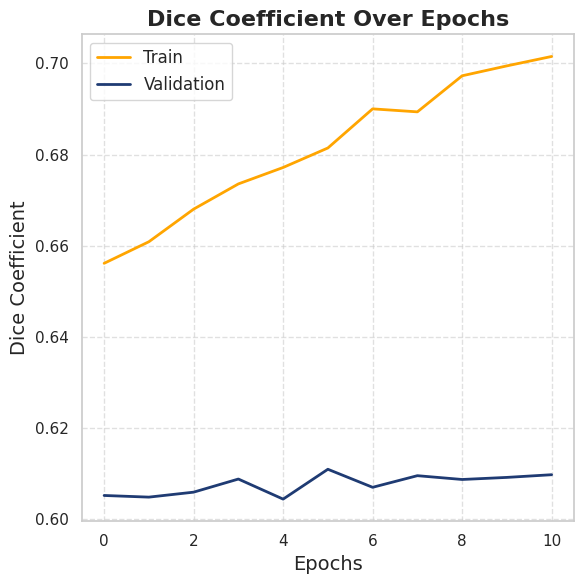

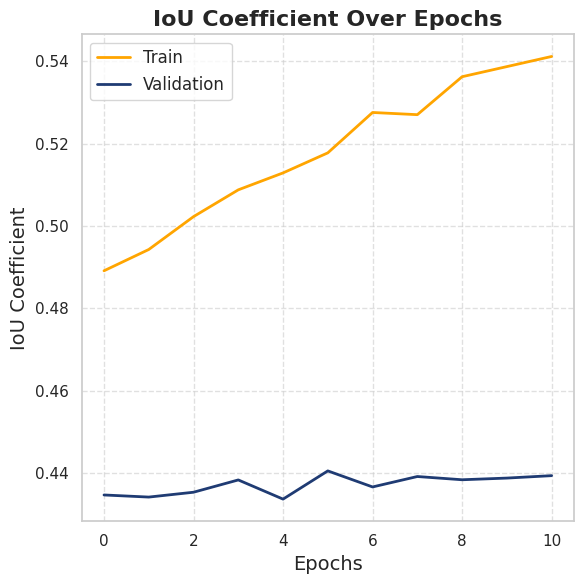

In [87]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, jaccard_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Visual Settings
sns.set_style("whitegrid")
plt.rcParams.update({
    "font.size": 12,
    "axes.labelsize": 14,
    "axes.titlesize": 16,
    "legend.fontsize": 12,
    "lines.linewidth": 2,
})

# 🟠 Orange: Train | 🔵 Dark Blue: Validation
def plot_training_metrics_individually(history):
    metrics = ['loss', 'accuracy', 'dice_coef', 'iou_coef']
    titles = ['Loss', 'Accuracy', 'Dice Coefficient', 'IoU Coefficient']
    colors = ['#FFA500', '#1f3b73']  # Orange and Dark Blue

    for i, metric in enumerate(metrics):
        plt.figure(figsize=(6, 6))  # Square box
        plt.plot(history.history[metric], label='Train', color=colors[0])
        plt.plot(history.history[f'val_{metric}'], label='Validation', color=colors[1])
        plt.title(f"{titles[i]} Over Epochs", fontsize=16, fontweight='bold')
        plt.xlabel("Epochs")
        plt.ylabel(titles[i])
        plt.legend(loc='best')
        plt.grid(True, linestyle='--', alpha=0.6)
        plt.tight_layout()
        plt.show()

# Run it
plot_training_metrics_individually(history)





6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


<ipython-input-77-6266c1503af2>:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["Accuracy", "Precision", "Recall", "F1 Score", "IoU", "Dice"],


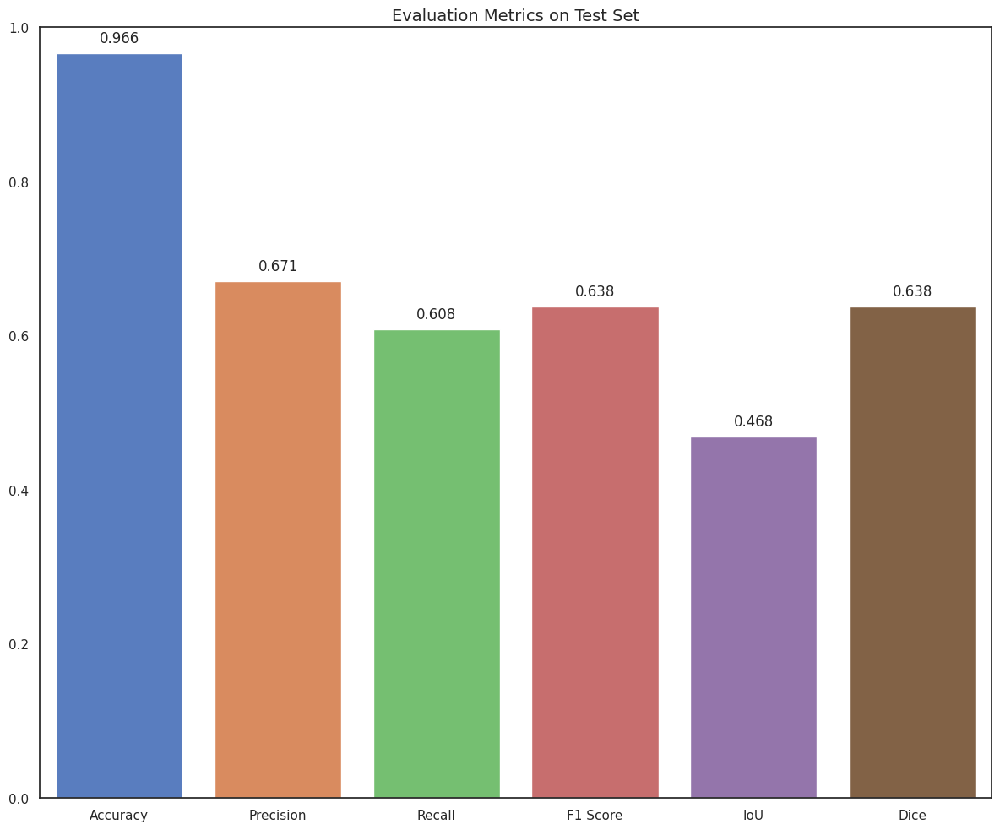

In [77]:
# 🟩 Cell 9: Evaluate on Test Set

# Predict on test set
preds = model.predict(X_test)
# Reshape to (-1, 256*256) to match the actual mask size
preds_bin = (preds > 0.5).astype(np.uint8).reshape(-1, 256*256)
y_true_flat = y_test.reshape(-1, 256*256)

# Flatten for sklearn metrics
flat_pred = preds_bin.flatten()
flat_true = y_true_flat.flatten()

# 🧮 Metrics
acc  = accuracy_score(flat_true, flat_pred)
prec = precision_score(flat_true, flat_pred)
rec  = recall_score(flat_true, flat_pred)
f1   = f1_score(flat_true, flat_pred)
iou  = jaccard_score(flat_true, flat_pred)
dice = (2 * prec * rec) / (prec + rec)

# 📊 Plot as Bar Chart
plt.figure(figsize=(12, 10))
sns.barplot(x=["Accuracy", "Precision", "Recall", "F1 Score", "IoU", "Dice"],
            y=[acc, prec, rec, f1, iou, dice],
            palette="muted")
plt.ylim(0, 1)
plt.title("Evaluation Metrics on Test Set", fontsize=14)
for i, val in enumerate([acc, prec, rec, f1, iou, dice]):
    plt.text(i, val + 0.01, f"{val:.3f}", ha='center', va='bottom', fontsize=12)
plt.tight_layout()
plt.show()

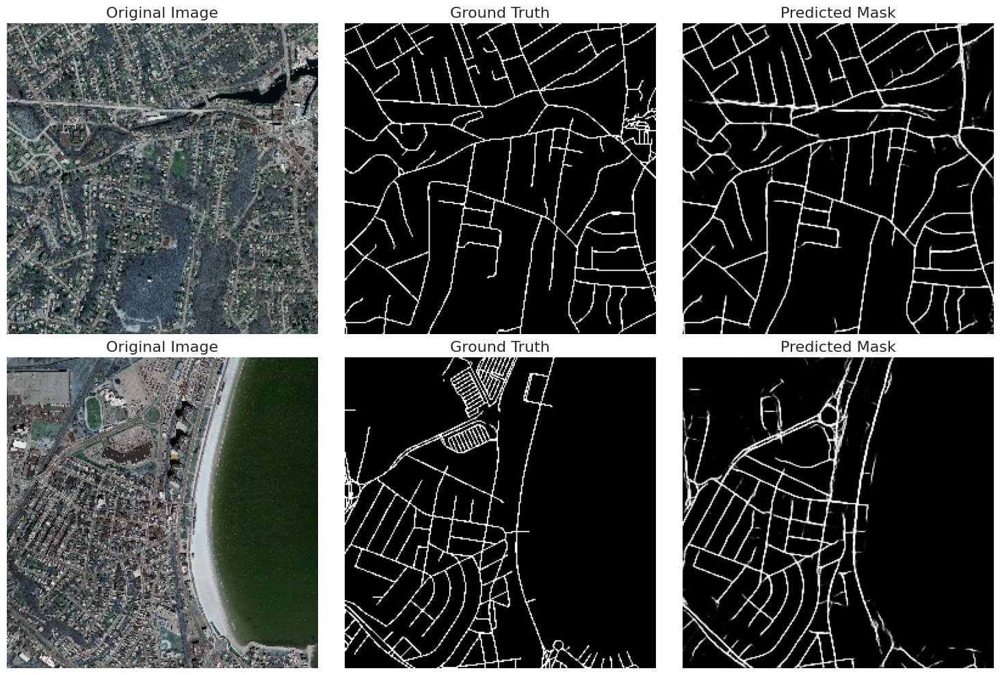

In [79]:
# 🟩 Cell 10: Show Predicted vs Ground Truth Overlay

import matplotlib.pyplot as plt

def show_predictions(X, y_true, y_pred, num=2):
    plt.figure(figsize=(15, num * 5))

    for i in range(num):
        # Original image
        plt.subplot(num, 3, i * 3 + 1)
        plt.imshow(X[i])
        plt.title("Original Image")
        plt.axis("off")

        # Ground Truth (B/W)
        plt.subplot(num, 3, i * 3 + 2)
        plt.imshow(y_true[i].squeeze(), cmap='gray')
        plt.title("Ground Truth")
        plt.axis("off")

        # Predicted Mask (B/W)
        plt.subplot(num, 3, i * 3 + 3)
        plt.imshow(y_pred[i].squeeze(), cmap='gray')
        plt.title("Predicted Mask")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# Example call (assuming X_test, y_test, preds are numpy arrays)
show_predictions(X_test, y_test, preds, num=2)



25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step


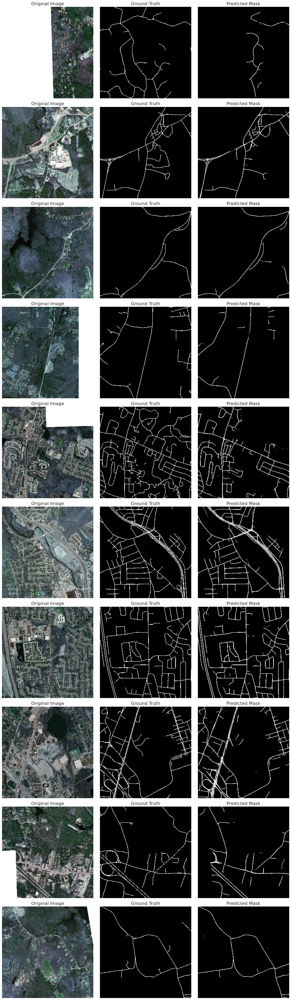

In [80]:
## on training dataset
show_predictions(X_train, y_train, model.predict(X_train), num=10)

6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 244ms/step


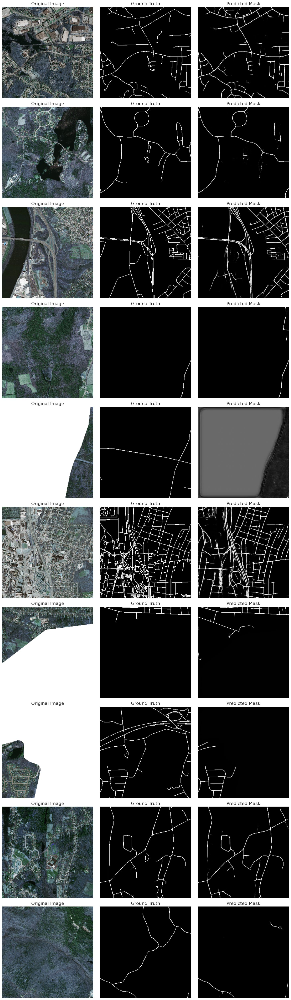

In [81]:
# For validation set
show_predictions(X_val, y_val, model.predict(X_val), num=10)

In [88]:
model.save("road_segmentation_model.h5")


